In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

In [2]:
house_data=pd.read_csv('kc_house_data.csv',parse_dates=['date'])
house_data.info()## no non_values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  int64         
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  int64         
 15  yr_renovated   2161

<span style="font-size: 30px;">Data understanding</span>

In [3]:
house_data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [4]:
house_data.info() ## no missing value

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  int64         
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  int64         
 15  yr_renovated   2161

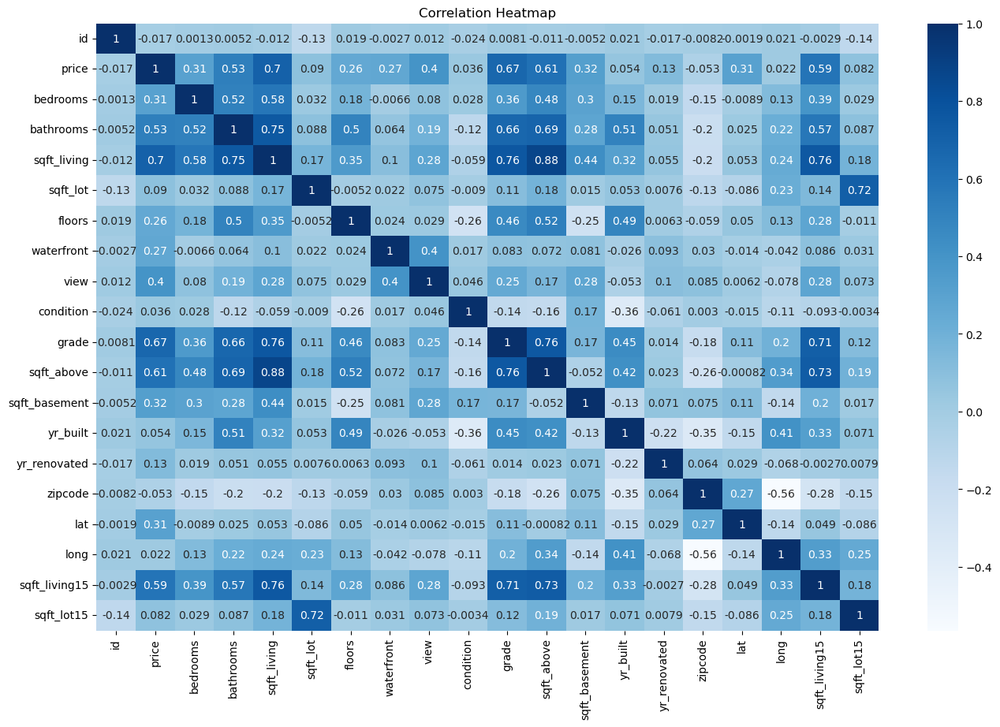

In [5]:
correlation_matrix = house_data.corr()
plt.figure(figsize=(16, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues')
plt.title("Correlation Heatmap")
plt.show()

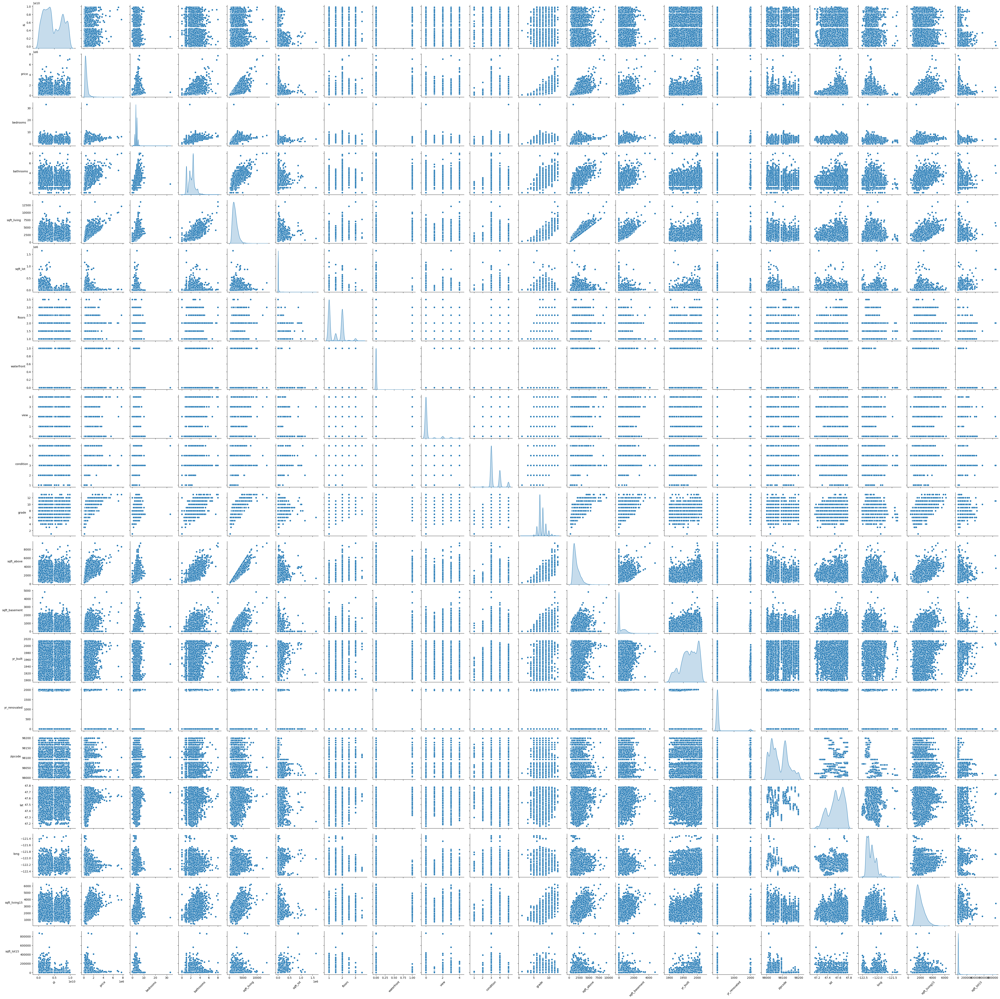

In [6]:
g=sns.pairplot(data=house_data,diag_kind='kde')
for ax in g.axes.flat:
    ax.set_xlabel(ax.get_xlabel(), rotation=45)
    ax.set_ylabel(ax.get_ylabel(), rotation=0, ha='right')

plt.show()

<span style="font-size: 30px;">Data Preprocessing</span>



In [7]:
house_data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [8]:
# #column adding
# house_data['num_of_room']=house_data['bedrooms']+house_data['bathrooms']
# ##transform numeric data to boolean data
# house_data['renovated_or_not']=(house_data['yr_renovated']!=0)*1 
# house_data['years_of_house']=2023-house_data['yr_built']
# ##transfrom numeric data to category data
# house_data['sqft_living_level']=pd.cut(house_data['sqft_living'],bins=[0,house_data['sqft_living'].quantile(0.25),house_data['sqft_living'].quantile(0.5),house_data['sqft_living'].quantile(0.75),house_data['sqft_living'].max()],labels=['1','2','3','4'])

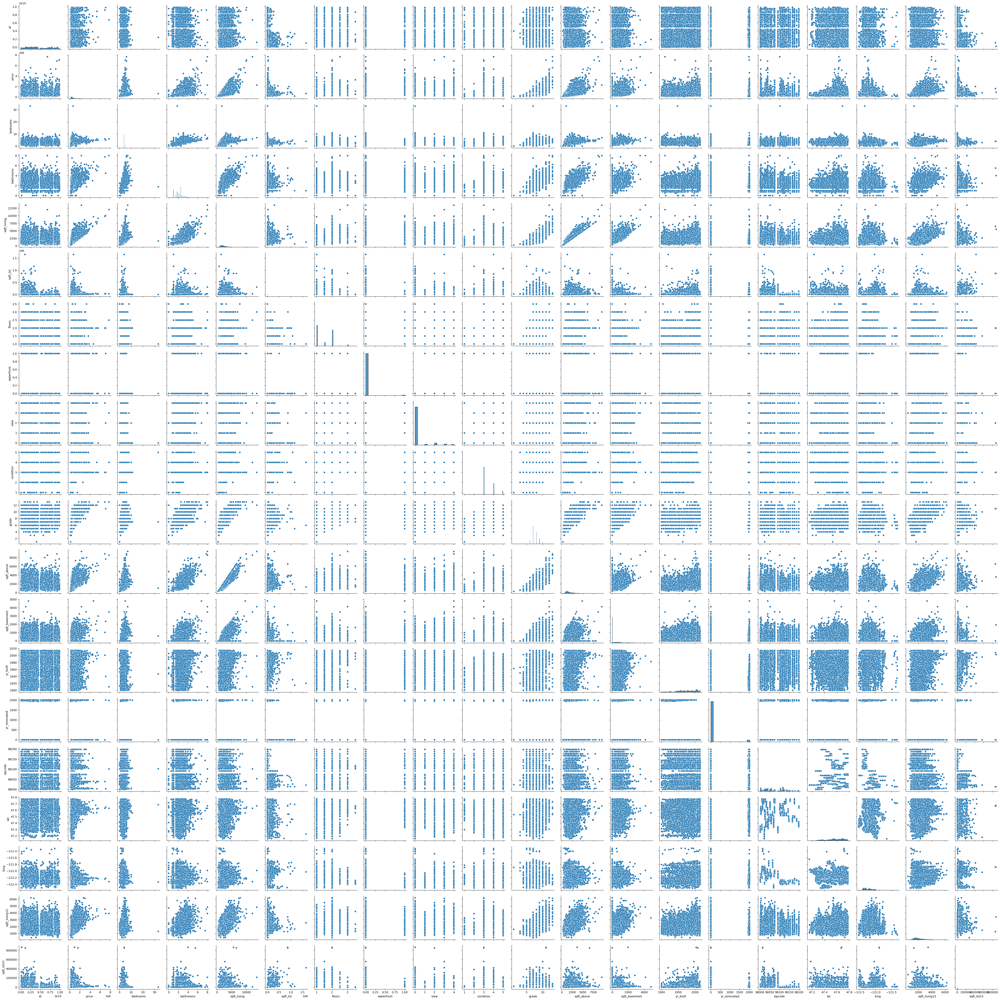

In [9]:
sns.pairplot(data=house_data)
plt.show()

In [10]:
house_data.corr().sort_values(by='price')  ## suitable iv=['sqft_living','grade','sqft_above','sqft_living15','bathrooms']

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
zipcode,-0.008224,-0.053203,-0.152668,-0.203866,-0.199430,-0.129574,-0.059121,0.030285,0.084827,0.003026,-0.184862,-0.261190,0.074845,-0.346869,0.064357,1.000000,0.267048,-0.564072,-0.279033,-0.147221
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798
long,0.020799,0.021626,0.129473,0.223042,0.240223,0.229521,0.125419,-0.041910,-0.078400,-0.106500,0.198372,0.343803,-0.144765,0.409356,-0.068372,-0.564072,-0.135512,1.000000,0.334605,0.254451
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406
yr_built,0.021380,0.054012,0.154178,0.506019,0.318049,0.053080,0.489319,-0.026161,-0.053440,-0.361417,0.446963,0.423898,-0.133124,1.000000,-0.224874,-0.346869,-0.148122,0.409356,0.326229,0.070958
sqft_lot15,-0.138798,0.082447,0.029244,0.087175,0.183286,0.718557,-0.011269,0.030703,0.072575,-0.003406,0.119248,0.194050,0.017276,0.070958,0.007854,-0.147221,-0.086419,0.254451,0.183192,1.000000
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
yr_renovated,-0.016907,0.126434,0.018841,0.050739,0.055363,0.007644,0.006338,0.092885,0.103917,-0.060618,0.014414,0.023285,0.071323,-0.224874,1.000000,0.064357,0.029398,-0.068372,-0.002673,0.007854
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703


In [11]:
# def drop_outlier(df, column):
    

    
#     seventy_fifth = df[column].quantile(0.75)
#     fifty = df[column].quantile(0.5)
#     twenty_fifth = df[column].quantile(0.25)
#     iqr = seventy_fifth - twenty_fifth
#     upper = seventy_fifth + iqr * 1.5
#     lower = twenty_fifth - iqr * 1.5
#     condition = ((df[column] > lower) & (df[column] < upper))
#     df = df[condition]

#     return df

In [12]:
## drop unrelated data
house_data.drop(columns=['id', 'date', 'condition', 'zipcode', 'long'], inplace=True)

In [13]:

# print(house_data.corr().sort_values(by='price',ascending=False)['price'])
# print(house_data.corr().sort_values(by='price',ascending=False)['price'].sum())

<span style="font-size: 30px;">BuildingmLinear Regression Model</span>

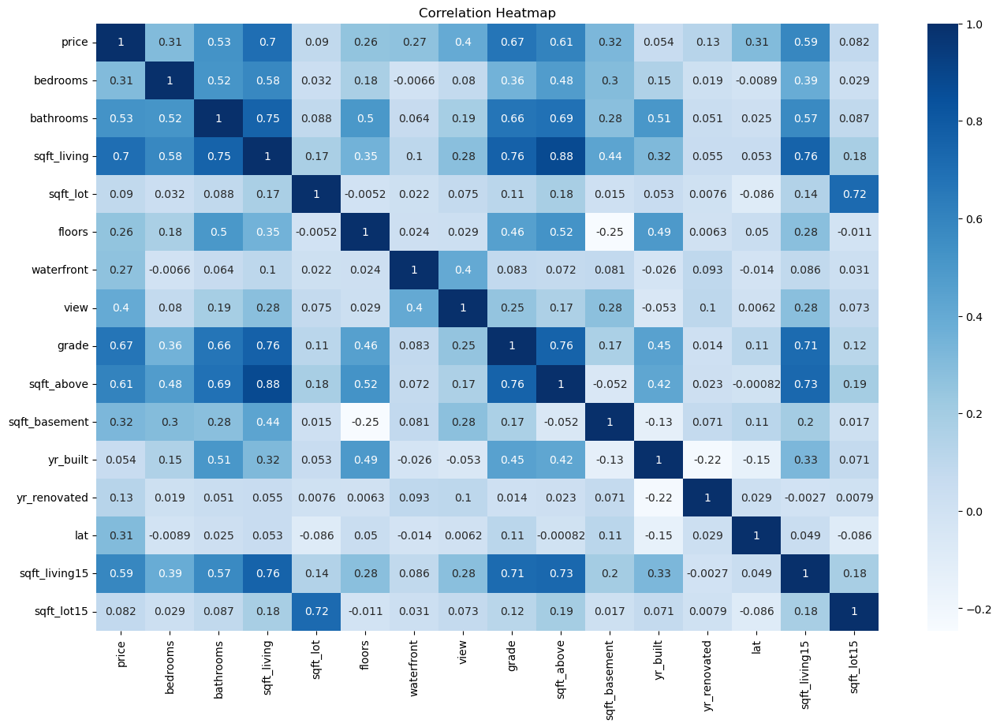

In [14]:
## to find possible moderator
correlation_matrix = house_data.corr()
plt.figure(figsize=(16, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues')
plt.title("Correlation Heatmap")
plt.show()

In [15]:
x = house_data.drop(columns='price')
y = house_data.price

In [16]:
from sklearn.metrics import mean_squared_error, r2_score
LR_Model = LinearRegression()
LR_Model.fit(x, y)
y_predict=LR_Model.predict(x)
# coef
coefficients = LR_Model.coef_
intercept = LR_Model.intercept_
print("model coef:", coefficients)
print("intercept:", intercept)

## performance
mse = mean_squared_error(y, y_predict)
r2 = r2_score(y, y_predict)

print("MSE:", mse)
print("R²:", r2)



model coef: [-3.33584004e+04  4.55111891e+04  1.09530947e+02  8.33505995e-02
  2.17140974e+03  5.92599396e+05  5.13608146e+04  1.01140841e+05
  6.50078808e+01  4.45230669e+01 -2.95756641e+03  1.17908732e+01
  5.53019474e+05  1.95294098e+01 -4.35182298e-01]
intercept: -21102684.055615608
MSE: 41535973181.344215
R²: 0.6918150905979623


In [17]:
LR_Model.score(x, y)

0.6918150905979623

In [18]:
import statsmodels.api as sm

X_with_intercept = sm.add_constant(x)  
model = sm.OLS(y, X_with_intercept).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.692
Method:                 Least Squares   F-statistic:                     3463.
Date:                Thu, 30 Nov 2023   Prob (F-statistic):               0.00
Time:                        03:02:40   Log-Likelihood:            -2.9488e+05
No. Observations:               21613   AIC:                         5.898e+05
Df Residuals:                   21598   BIC:                         5.899e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -2.11e+07   5.43e+05    -38.859

grade:1.011e+05;sqft_above:65.0079;sqft_living15:19.5294.

<span style="font-size: 30px;">Run Regression with moderation to improve model</span>

Given the correlation map, we can see that: grade has strong correlation with column sqft_above+sqft_living15

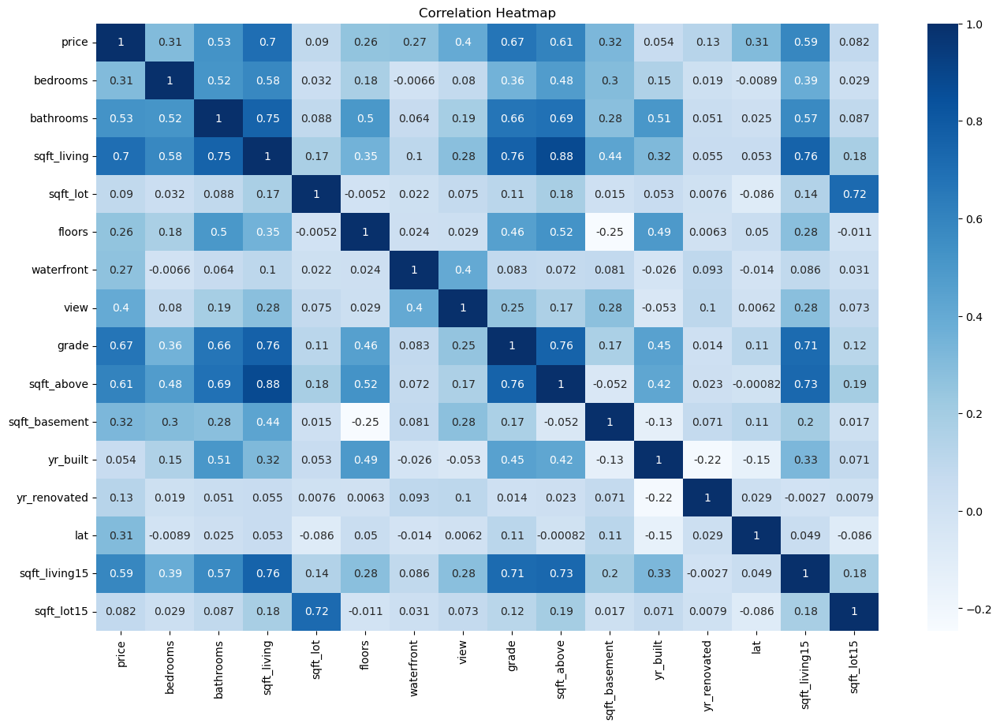

In [19]:
## to find possible moderator
correlation_matrix = house_data.corr()
plt.figure(figsize=(16, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues')
plt.title("Correlation Heatmap")
plt.show()

In [20]:
df1=house_data.copy()

In [21]:
df1.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'grade', 'sqft_above', 'sqft_basement',
       'yr_built', 'yr_renovated', 'lat', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [22]:
df1['grade*(sqft_above+sqft_living15)']=df1['grade']*(df1['sqft_above']+df1['sqft_living15'])

In [23]:
x = df1.drop(columns='price')
y = df1.price
LR_Model1 = LinearRegression()
LR_Model1.fit(x, y)
LR_Model1.score(x, y)
LR_Model1.coef_
X_with_intercept = sm.add_constant(x)  
model = sm.OLS(y, X_with_intercept).fit()
print(model.summary())
# R2 increase and the decrease of AIC and BIC show the improvement of model. 
#before : grade:1.011e+05;sqft_above:65.0079;sqft_living15:19.5294.
#after : grade:-7191;sqft_above:-103;sqft_living15:19.5294.
# however,the mean of coef for these three variable is hard to explain.

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.714
Model:                            OLS   Adj. R-squared:                  0.714
Method:                 Least Squares   F-statistic:                     3589.
Date:                Thu, 30 Nov 2023   Prob (F-statistic):               0.00
Time:                        03:02:41   Log-Likelihood:            -2.9409e+05
No. Observations:               21613   AIC:                         5.882e+05
Df Residuals:                   21597   BIC:                         5.883e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const   

<span style="font-size: 30px;">reduce outlier to improve model quality</span>

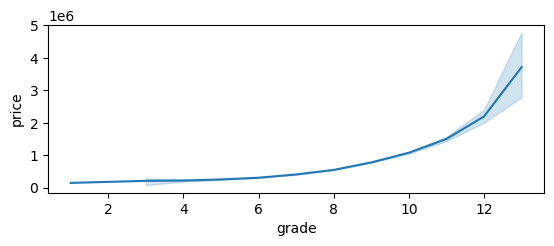

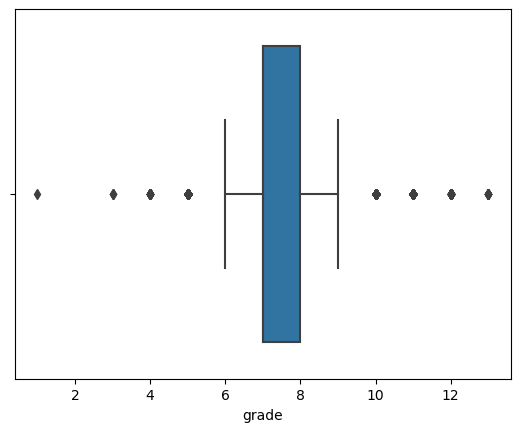

In [24]:
plt.subplot(211)
sns.lineplot(data=df1,x='grade',y='price')
plt.show()
sns.boxplot(data=df1,x='grade')
plt.show()
##we can see that for grade =11 & 12 , the mean of price change dramatically，model will be better if we drop this part of data.

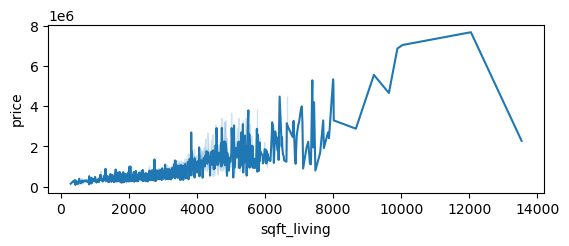

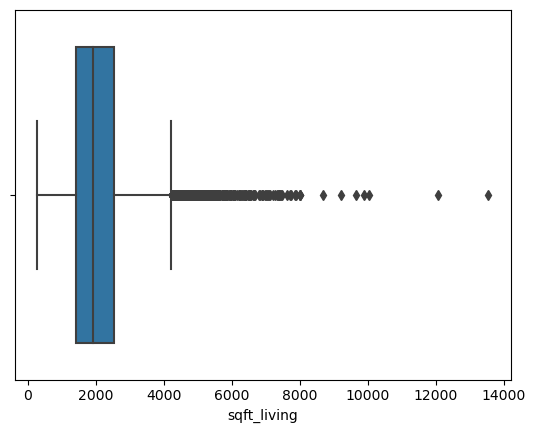

In [25]:
plt.subplot(211)
sns.lineplot(data=df1,x='sqft_living',y='price')
plt.show()
sns.boxplot(data=df1,x='sqft_living')
plt.show()
##reduce the outlier for more than 12000

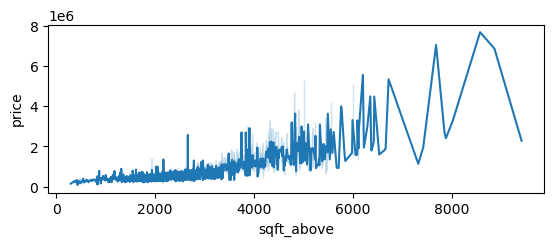

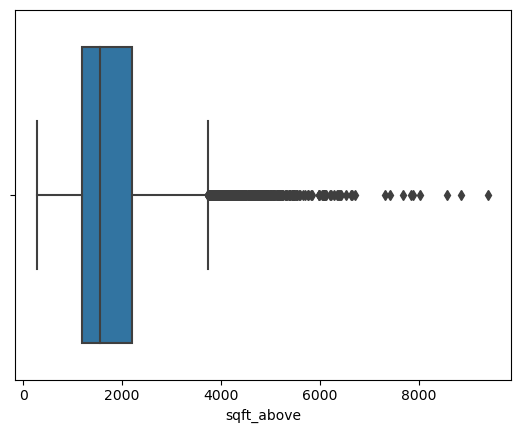

In [26]:
plt.subplot(211)
sns.lineplot(data=df1,x='sqft_above',y='price')
plt.show()
sns.boxplot(data=df1,x='sqft_above')
plt.show()
##reduce the outlier for more than 7000

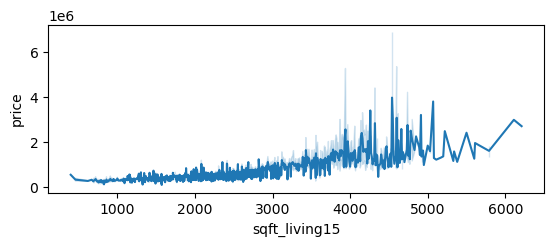

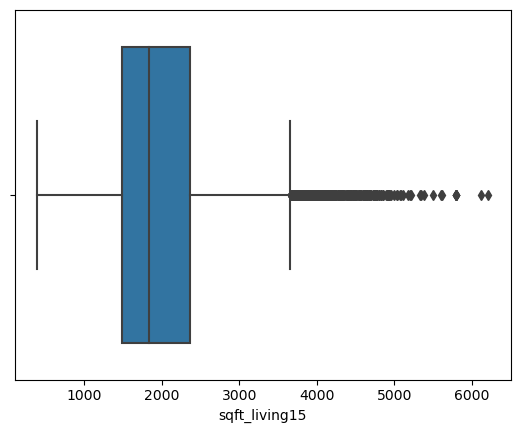

In [27]:
plt.subplot(211)
sns.lineplot(data=df1,x='sqft_living15',y='price')
plt.show()
sns.boxplot(data=df1,x='sqft_living15')
plt.show()
##reduce the outlier for more than 5000

In [28]:
conditions=(df1['grade']<11)&(df1['sqft_living']<12000)&(df1['sqft_above']<7000)&(df1['sqft_living15']<5000)
df2=df1[conditions]

In [29]:
x = df2.drop(columns='price')
y = df2.price
LR_Model2 = LinearRegression()
LR_Model2.fit(x, y)
LR_Model2.score(x, y)
LR_Model2.coef_
X_with_intercept = sm.add_constant(x)  
model = sm.OLS(y, X_with_intercept).fit()
print(model.summary())
## lower AIC and BIC indicate that this model performs better.
y_pred_LR_Model2 = LR_Model2.predict(x)

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     2930.
Date:                Thu, 30 Nov 2023   Prob (F-statistic):               0.00
Time:                        03:03:02   Log-Likelihood:            -2.8376e+05
No. Observations:               21106   AIC:                         5.675e+05
Df Residuals:                   21090   BIC:                         5.677e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const   

<span style="font-size: 30px;">Use RANSAC model to solve the problem of outlier</span>

In [30]:
from sklearn.linear_model import RANSACRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

x = df1.drop(columns='price')
y = df1.price

Model3 = RANSACRegressor()

Model3.fit(x, y)
y_pred = Model3.predict(x)

# coef
coefficients = Model3.estimator_.coef_
intercept = Model3.estimator_.intercept_
print("model coef:", coefficients)
print("intercept:", intercept)

## performance
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("MSE:", mse)
print("R²:", r2)

##model 2 performs better als model 3 considering R2

model coef: [-2.41240833e+04  2.13914729e+04  6.04139257e+01  4.74276039e-01
  3.43306866e+04  3.57552344e+04  1.31265430e+04  3.83158375e+04
 -1.97415107e+01  8.01554365e+01 -1.77278349e+03  1.99092331e+00
  4.07464990e+05 -9.26538997e+01 -2.14928676e-01  1.03064558e+01]
intercept: -15954551.132120967
MSE: 53805233273.592575
R²: 0.6007807288062923


<span style="font-size: 30px;">visualization Of LR_Model2 </span>

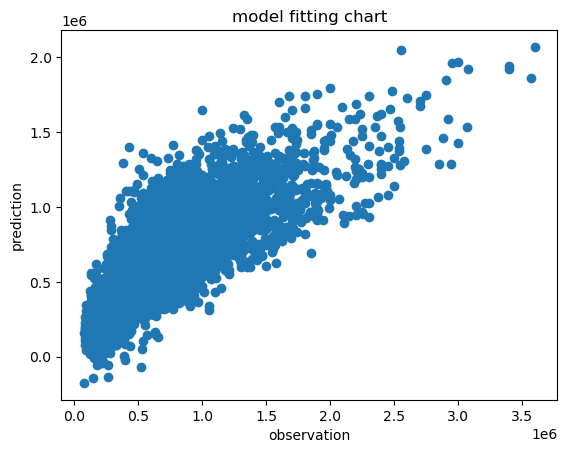

In [35]:
y = df2.price
plt.scatter(y, y_pred_LR_Model2)
plt.xlabel("observation")
plt.ylabel("prediction")
plt.title("model fitting chart")
plt.show()
